
# Training - uTrack

Code for training a uTrack network.

## INITIALIZATION

In [1]:
import unet, imageGeneration

## DEFINE AND CHECK IMAGE GENERATION ROUTINE
<a id="sec2"></a>

Here, we simulate images of a variety of images.

Comments:
1. The <strong>image_parameters_function</strong> is a lambda function that determines the kind of particle images for which the deep learning network will be trained. Tuning its parameters is the simplest way to improve the tracking performance.<br/>
3. The parameter <strong>number_of_images_to_show</strong> determines the number of sample images that are shown.
4. The <font color=red><strong>red<strong></font> symbol superimposed to the images represents the ground truth particle position.

Time taken for batch generation of size 1: 0.19150066375732422 s.


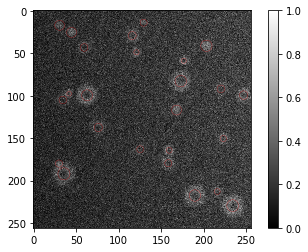

In [2]:
### Define image properties
import numpy as np

def get_image_parameters():
    from numpy.random import uniform, randint, exponential
    from numpy import ones, clip
    from math import pi
    
    image_size = 256
    
    particle_number = randint(10, 30)
    particle_radius_list = uniform(2, 8, particle_number)
    (particle_center_x_list, particle_center_y_list) = imageGeneration.generate_particle_positions(particle_radius_list, image_size)

    particle_bessel_orders_list = []
    particle_intensities_list = []

    for i in range(particle_number):
        particle_bessel_orders_list.append([randint(1,3), ])
        particle_intensities_list.append([uniform(0.1, 0.3, 1), ])

    image_parameters = imageGeneration.get_image_parameters(
        particle_center_x_list=lambda: particle_center_x_list,
        particle_center_y_list=lambda: particle_center_y_list,
        particle_radius_list=lambda: particle_radius_list,
        particle_bessel_orders_list=lambda: particle_bessel_orders_list,
        particle_intensities_list=lambda: particle_intensities_list,
        image_size=lambda: image_size,
        image_background_level=lambda: uniform(0.1, 0.3),
        signal_to_noise_ratio=lambda: clip((exponential(8,1) + 1), 1, 200),
        gradient_intensity=lambda: uniform(0, 0.4),
        gradient_direction=lambda: uniform(-pi, pi),
        ellipsoidal_orientation=lambda: uniform(-pi, pi, particle_number),
        ellipticity=lambda: 1)

    return image_parameters

image_parameters_function = lambda : get_image_parameters()

### Show some examples of generated images
number_of_images_to_show = 1

batch = imageGeneration.get_batch(get_image_parameters_function = image_parameters_function, batch_size = number_of_images_to_show)

for i in range(number_of_images_to_show):
    imageGeneration.visualise_batch(batch, index_of_image_to_show = i, zoom_value = 1.0, use_predictions = False, use_batch_particle_attributes = True)



## Fit using generator

In [3]:
import time
t = time.time()
from keras.callbacks import ModelCheckpoint

model = unet.create_unet()



generator = imageGeneration.create_data_generator(get_image_parameters = image_parameters_function,
                                                  batch_size = 64,
                                                  iterations = 1,
                                                  suppress_warnings = True,
                                                  verbose = False)

model_checkpoint = ModelCheckpoint('unet_particle.hdf5', monitor='loss',verbose=1, save_best_only=True)


model.fit_generator(generator, epochs = 10000, callbacks = [model_checkpoint], verbose = False)
    
time_taken = time.time() - t
print("Time taken for training: " + str(time_taken) + " s.")
    

Using TensorFlow backend.



Epoch 00001: loss improved from inf to 55.72056, saving model to unet_particle.hdf5

Epoch 00002: loss improved from 55.72056 to 55.31142, saving model to unet_particle.hdf5

Epoch 00003: loss improved from 55.31142 to 54.32008, saving model to unet_particle.hdf5

Epoch 00004: loss improved from 54.32008 to 53.64737, saving model to unet_particle.hdf5

Epoch 00005: loss did not improve from 53.64737

Epoch 00006: loss did not improve from 53.64737

Epoch 00007: loss improved from 53.64737 to 51.98638, saving model to unet_particle.hdf5

Epoch 00008: loss did not improve from 51.98638

Epoch 00009: loss did not improve from 51.98638

Epoch 00010: loss did not improve from 51.98638

Epoch 00011: loss improved from 51.98638 to 51.46752, saving model to unet_particle.hdf5

Epoch 00012: loss did not improve from 51.46752

Epoch 00013: loss did not improve from 51.46752

Epoch 00014: loss did not improve from 51.46752

Epoch 00015: loss improved from 51.46752 to 50.92979, saving model to un


Epoch 00135: loss improved from 26.54581 to 26.41416, saving model to unet_particle.hdf5

Epoch 00136: loss improved from 26.41416 to 26.31667, saving model to unet_particle.hdf5

Epoch 00137: loss did not improve from 26.31667

Epoch 00138: loss did not improve from 26.31667

Epoch 00139: loss did not improve from 26.31667

Epoch 00140: loss improved from 26.31667 to 26.06587, saving model to unet_particle.hdf5

Epoch 00141: loss did not improve from 26.06587

Epoch 00142: loss improved from 26.06587 to 25.02124, saving model to unet_particle.hdf5

Epoch 00143: loss did not improve from 25.02124

Epoch 00144: loss did not improve from 25.02124

Epoch 00145: loss did not improve from 25.02124

Epoch 00146: loss did not improve from 25.02124

Epoch 00147: loss did not improve from 25.02124

Epoch 00148: loss did not improve from 25.02124

Epoch 00149: loss did not improve from 25.02124

Epoch 00150: loss improved from 25.02124 to 24.96662, saving model to unet_particle.hdf5

Epoch 0015


Epoch 00286: loss improved from 17.97644 to 17.36092, saving model to unet_particle.hdf5

Epoch 00287: loss did not improve from 17.36092

Epoch 00288: loss did not improve from 17.36092

Epoch 00289: loss did not improve from 17.36092

Epoch 00290: loss did not improve from 17.36092

Epoch 00291: loss did not improve from 17.36092

Epoch 00292: loss did not improve from 17.36092

Epoch 00293: loss did not improve from 17.36092

Epoch 00294: loss did not improve from 17.36092

Epoch 00295: loss did not improve from 17.36092

Epoch 00296: loss did not improve from 17.36092

Epoch 00297: loss did not improve from 17.36092

Epoch 00298: loss did not improve from 17.36092

Epoch 00299: loss did not improve from 17.36092

Epoch 00300: loss did not improve from 17.36092

Epoch 00301: loss did not improve from 17.36092

Epoch 00302: loss did not improve from 17.36092

Epoch 00303: loss did not improve from 17.36092

Epoch 00304: loss did not improve from 17.36092

Epoch 00305: loss did not i


Epoch 00449: loss did not improve from 15.02851

Epoch 00450: loss did not improve from 15.02851

Epoch 00451: loss did not improve from 15.02851

Epoch 00452: loss did not improve from 15.02851

Epoch 00453: loss did not improve from 15.02851

Epoch 00454: loss did not improve from 15.02851

Epoch 00455: loss did not improve from 15.02851

Epoch 00456: loss did not improve from 15.02851

Epoch 00457: loss did not improve from 15.02851

Epoch 00458: loss did not improve from 15.02851

Epoch 00459: loss did not improve from 15.02851

Epoch 00460: loss did not improve from 15.02851

Epoch 00461: loss did not improve from 15.02851

Epoch 00462: loss did not improve from 15.02851

Epoch 00463: loss did not improve from 15.02851

Epoch 00464: loss did not improve from 15.02851

Epoch 00465: loss did not improve from 15.02851

Epoch 00466: loss did not improve from 15.02851

Epoch 00467: loss did not improve from 15.02851

Epoch 00468: loss did not improve from 15.02851

Epoch 00469: loss d


Epoch 00615: loss did not improve from 14.20530

Epoch 00616: loss did not improve from 14.20530

Epoch 00617: loss did not improve from 14.20530

Epoch 00618: loss did not improve from 14.20530

Epoch 00619: loss did not improve from 14.20530

Epoch 00620: loss did not improve from 14.20530

Epoch 00621: loss did not improve from 14.20530

Epoch 00622: loss did not improve from 14.20530

Epoch 00623: loss did not improve from 14.20530

Epoch 00624: loss did not improve from 14.20530

Epoch 00625: loss did not improve from 14.20530

Epoch 00626: loss did not improve from 14.20530

Epoch 00627: loss did not improve from 14.20530

Epoch 00628: loss did not improve from 14.20530

Epoch 00629: loss did not improve from 14.20530

Epoch 00630: loss did not improve from 14.20530

Epoch 00631: loss did not improve from 14.20530

Epoch 00632: loss did not improve from 14.20530

Epoch 00633: loss did not improve from 14.20530

Epoch 00634: loss did not improve from 14.20530

Epoch 00635: loss d


Epoch 00780: loss did not improve from 13.31067

Epoch 00781: loss did not improve from 13.31067

Epoch 00782: loss did not improve from 13.31067

Epoch 00783: loss did not improve from 13.31067

Epoch 00784: loss did not improve from 13.31067

Epoch 00785: loss did not improve from 13.31067

Epoch 00786: loss did not improve from 13.31067

Epoch 00787: loss did not improve from 13.31067

Epoch 00788: loss improved from 13.31067 to 13.27932, saving model to unet_particle.hdf5

Epoch 00789: loss did not improve from 13.27932

Epoch 00790: loss did not improve from 13.27932

Epoch 00791: loss did not improve from 13.27932

Epoch 00792: loss did not improve from 13.27932

Epoch 00793: loss did not improve from 13.27932

Epoch 00794: loss did not improve from 13.27932

Epoch 00795: loss did not improve from 13.27932

Epoch 00796: loss did not improve from 13.27932

Epoch 00797: loss did not improve from 13.27932

Epoch 00798: loss did not improve from 13.27932

Epoch 00799: loss did not i


Epoch 00944: loss did not improve from 12.73813

Epoch 00945: loss did not improve from 12.73813

Epoch 00946: loss did not improve from 12.73813

Epoch 00947: loss did not improve from 12.73813

Epoch 00948: loss did not improve from 12.73813

Epoch 00949: loss did not improve from 12.73813

Epoch 00950: loss did not improve from 12.73813

Epoch 00951: loss did not improve from 12.73813

Epoch 00952: loss did not improve from 12.73813

Epoch 00953: loss did not improve from 12.73813

Epoch 00954: loss did not improve from 12.73813

Epoch 00955: loss did not improve from 12.73813

Epoch 00956: loss did not improve from 12.73813

Epoch 00957: loss did not improve from 12.73813

Epoch 00958: loss did not improve from 12.73813

Epoch 00959: loss did not improve from 12.73813

Epoch 00960: loss did not improve from 12.73813

Epoch 00961: loss did not improve from 12.73813

Epoch 00962: loss did not improve from 12.73813

Epoch 00963: loss did not improve from 12.73813

Epoch 00964: loss d


Epoch 01110: loss did not improve from 11.91476

Epoch 01111: loss did not improve from 11.91476

Epoch 01112: loss did not improve from 11.91476

Epoch 01113: loss did not improve from 11.91476

Epoch 01114: loss improved from 11.91476 to 11.85032, saving model to unet_particle.hdf5

Epoch 01115: loss did not improve from 11.85032

Epoch 01116: loss did not improve from 11.85032

Epoch 01117: loss did not improve from 11.85032

Epoch 01118: loss did not improve from 11.85032

Epoch 01119: loss did not improve from 11.85032

Epoch 01120: loss did not improve from 11.85032

Epoch 01121: loss did not improve from 11.85032

Epoch 01122: loss did not improve from 11.85032

Epoch 01123: loss did not improve from 11.85032

Epoch 01124: loss did not improve from 11.85032

Epoch 01125: loss did not improve from 11.85032

Epoch 01126: loss did not improve from 11.85032

Epoch 01127: loss did not improve from 11.85032

Epoch 01128: loss did not improve from 11.85032

Epoch 01129: loss did not i


Epoch 01274: loss did not improve from 11.21747

Epoch 01275: loss did not improve from 11.21747

Epoch 01276: loss did not improve from 11.21747

Epoch 01277: loss did not improve from 11.21747

Epoch 01278: loss did not improve from 11.21747

Epoch 01279: loss did not improve from 11.21747

Epoch 01280: loss did not improve from 11.21747

Epoch 01281: loss did not improve from 11.21747

Epoch 01282: loss did not improve from 11.21747

Epoch 01283: loss did not improve from 11.21747

Epoch 01284: loss did not improve from 11.21747

Epoch 01285: loss did not improve from 11.21747

Epoch 01286: loss did not improve from 11.21747

Epoch 01287: loss did not improve from 11.21747

Epoch 01288: loss did not improve from 11.21747

Epoch 01289: loss did not improve from 11.21747

Epoch 01290: loss did not improve from 11.21747

Epoch 01291: loss did not improve from 11.21747

Epoch 01292: loss did not improve from 11.21747

Epoch 01293: loss did not improve from 11.21747

Epoch 01294: loss d


Epoch 01439: loss did not improve from 10.87220

Epoch 01440: loss did not improve from 10.87220

Epoch 01441: loss did not improve from 10.87220

Epoch 01442: loss did not improve from 10.87220

Epoch 01443: loss did not improve from 10.87220

Epoch 01444: loss did not improve from 10.87220

Epoch 01445: loss did not improve from 10.87220

Epoch 01446: loss did not improve from 10.87220

Epoch 01447: loss did not improve from 10.87220

Epoch 01448: loss did not improve from 10.87220

Epoch 01449: loss improved from 10.87220 to 10.71121, saving model to unet_particle.hdf5

Epoch 01450: loss did not improve from 10.71121

Epoch 01451: loss did not improve from 10.71121

Epoch 01452: loss did not improve from 10.71121

Epoch 01453: loss did not improve from 10.71121

Epoch 01454: loss did not improve from 10.71121

Epoch 01455: loss did not improve from 10.71121

Epoch 01456: loss did not improve from 10.71121

Epoch 01457: loss did not improve from 10.71121

Epoch 01458: loss did not i


Epoch 01605: loss did not improve from 10.28625

Epoch 01606: loss did not improve from 10.28625

Epoch 01607: loss did not improve from 10.28625

Epoch 01608: loss did not improve from 10.28625

Epoch 01609: loss did not improve from 10.28625

Epoch 01610: loss did not improve from 10.28625

Epoch 01611: loss did not improve from 10.28625

Epoch 01612: loss did not improve from 10.28625

Epoch 01613: loss did not improve from 10.28625

Epoch 01614: loss did not improve from 10.28625

Epoch 01615: loss did not improve from 10.28625

Epoch 01616: loss did not improve from 10.28625

Epoch 01617: loss did not improve from 10.28625

Epoch 01618: loss did not improve from 10.28625

Epoch 01619: loss did not improve from 10.28625

Epoch 01620: loss did not improve from 10.28625

Epoch 01621: loss did not improve from 10.28625

Epoch 01622: loss did not improve from 10.28625

Epoch 01623: loss did not improve from 10.28625

Epoch 01624: loss did not improve from 10.28625

Epoch 01625: loss d


Epoch 01773: loss did not improve from 10.28625

Epoch 01774: loss did not improve from 10.28625

Epoch 01775: loss did not improve from 10.28625

Epoch 01776: loss did not improve from 10.28625

Epoch 01777: loss did not improve from 10.28625

Epoch 01778: loss did not improve from 10.28625

Epoch 01779: loss did not improve from 10.28625

Epoch 01780: loss did not improve from 10.28625

Epoch 01781: loss did not improve from 10.28625

Epoch 01782: loss did not improve from 10.28625

Epoch 01783: loss did not improve from 10.28625

Epoch 01784: loss did not improve from 10.28625

Epoch 01785: loss did not improve from 10.28625

Epoch 01786: loss did not improve from 10.28625

Epoch 01787: loss did not improve from 10.28625

Epoch 01788: loss did not improve from 10.28625

Epoch 01789: loss did not improve from 10.28625

Epoch 01790: loss did not improve from 10.28625

Epoch 01791: loss did not improve from 10.28625

Epoch 01792: loss improved from 10.28625 to 9.83183, saving model to


Epoch 01943: loss did not improve from 9.83183

Epoch 01944: loss did not improve from 9.83183

Epoch 01945: loss did not improve from 9.83183

Epoch 01946: loss did not improve from 9.83183

Epoch 01947: loss did not improve from 9.83183

Epoch 01948: loss did not improve from 9.83183

Epoch 01949: loss did not improve from 9.83183

Epoch 01950: loss did not improve from 9.83183

Epoch 01951: loss improved from 9.83183 to 9.58018, saving model to unet_particle.hdf5

Epoch 01952: loss did not improve from 9.58018

Epoch 01953: loss did not improve from 9.58018

Epoch 01954: loss did not improve from 9.58018

Epoch 01955: loss did not improve from 9.58018

Epoch 01956: loss did not improve from 9.58018

Epoch 01957: loss improved from 9.58018 to 9.33786, saving model to unet_particle.hdf5

Epoch 01958: loss did not improve from 9.33786

Epoch 01959: loss did not improve from 9.33786

Epoch 01960: loss did not improve from 9.33786

Epoch 01961: loss did not improve from 9.33786

Epoch 0


Epoch 02113: loss did not improve from 9.33786

Epoch 02114: loss did not improve from 9.33786

Epoch 02115: loss did not improve from 9.33786

Epoch 02116: loss did not improve from 9.33786

Epoch 02117: loss did not improve from 9.33786

Epoch 02118: loss did not improve from 9.33786

Epoch 02119: loss did not improve from 9.33786

Epoch 02120: loss did not improve from 9.33786

Epoch 02121: loss did not improve from 9.33786

Epoch 02122: loss did not improve from 9.33786

Epoch 02123: loss did not improve from 9.33786

Epoch 02124: loss did not improve from 9.33786

Epoch 02125: loss did not improve from 9.33786

Epoch 02126: loss did not improve from 9.33786

Epoch 02127: loss did not improve from 9.33786

Epoch 02128: loss did not improve from 9.33786

Epoch 02129: loss did not improve from 9.33786

Epoch 02130: loss did not improve from 9.33786

Epoch 02131: loss did not improve from 9.33786

Epoch 02132: loss did not improve from 9.33786

Epoch 02133: loss did not improve from 


Epoch 02283: loss did not improve from 9.19199

Epoch 02284: loss did not improve from 9.19199

Epoch 02285: loss did not improve from 9.19199

Epoch 02286: loss did not improve from 9.19199

Epoch 02287: loss did not improve from 9.19199

Epoch 02288: loss did not improve from 9.19199

Epoch 02289: loss did not improve from 9.19199

Epoch 02290: loss did not improve from 9.19199

Epoch 02291: loss did not improve from 9.19199

Epoch 02292: loss did not improve from 9.19199

Epoch 02293: loss did not improve from 9.19199

Epoch 02294: loss did not improve from 9.19199

Epoch 02295: loss did not improve from 9.19199

Epoch 02296: loss did not improve from 9.19199

Epoch 02297: loss did not improve from 9.19199

Epoch 02298: loss did not improve from 9.19199

Epoch 02299: loss did not improve from 9.19199

Epoch 02300: loss did not improve from 9.19199

Epoch 02301: loss did not improve from 9.19199

Epoch 02302: loss did not improve from 9.19199

Epoch 02303: loss did not improve from 


Epoch 02453: loss did not improve from 8.91936

Epoch 02454: loss did not improve from 8.91936

Epoch 02455: loss did not improve from 8.91936

Epoch 02456: loss did not improve from 8.91936

Epoch 02457: loss did not improve from 8.91936

Epoch 02458: loss did not improve from 8.91936

Epoch 02459: loss did not improve from 8.91936

Epoch 02460: loss did not improve from 8.91936

Epoch 02461: loss did not improve from 8.91936

Epoch 02462: loss did not improve from 8.91936

Epoch 02463: loss did not improve from 8.91936

Epoch 02464: loss did not improve from 8.91936

Epoch 02465: loss did not improve from 8.91936

Epoch 02466: loss did not improve from 8.91936

Epoch 02467: loss did not improve from 8.91936

Epoch 02468: loss did not improve from 8.91936

Epoch 02469: loss did not improve from 8.91936

Epoch 02470: loss did not improve from 8.91936

Epoch 02471: loss did not improve from 8.91936

Epoch 02472: loss did not improve from 8.91936

Epoch 02473: loss did not improve from 


Epoch 02624: loss did not improve from 8.91936

Epoch 02625: loss did not improve from 8.91936

Epoch 02626: loss did not improve from 8.91936

Epoch 02627: loss did not improve from 8.91936

Epoch 02628: loss did not improve from 8.91936

Epoch 02629: loss did not improve from 8.91936

Epoch 02630: loss did not improve from 8.91936

Epoch 02631: loss did not improve from 8.91936

Epoch 02632: loss did not improve from 8.91936

Epoch 02633: loss did not improve from 8.91936

Epoch 02634: loss did not improve from 8.91936

Epoch 02635: loss did not improve from 8.91936

Epoch 02636: loss did not improve from 8.91936

Epoch 02637: loss did not improve from 8.91936

Epoch 02638: loss did not improve from 8.91936

Epoch 02639: loss improved from 8.91936 to 8.83414, saving model to unet_particle.hdf5

Epoch 02640: loss did not improve from 8.83414

Epoch 02641: loss did not improve from 8.83414

Epoch 02642: loss did not improve from 8.83414

Epoch 02643: loss did not improve from 8.83414



Epoch 02794: loss did not improve from 8.24341

Epoch 02795: loss did not improve from 8.24341

Epoch 02796: loss did not improve from 8.24341

Epoch 02797: loss did not improve from 8.24341

Epoch 02798: loss did not improve from 8.24341

Epoch 02799: loss did not improve from 8.24341

Epoch 02800: loss did not improve from 8.24341

Epoch 02801: loss did not improve from 8.24341

Epoch 02802: loss did not improve from 8.24341

Epoch 02803: loss did not improve from 8.24341

Epoch 02804: loss did not improve from 8.24341

Epoch 02805: loss did not improve from 8.24341

Epoch 02806: loss did not improve from 8.24341

Epoch 02807: loss did not improve from 8.24341

Epoch 02808: loss did not improve from 8.24341

Epoch 02809: loss did not improve from 8.24341

Epoch 02810: loss did not improve from 8.24341

Epoch 02811: loss did not improve from 8.24341

Epoch 02812: loss did not improve from 8.24341

Epoch 02813: loss did not improve from 8.24341

Epoch 02814: loss did not improve from 


Epoch 02965: loss did not improve from 8.24341

Epoch 02966: loss did not improve from 8.24341

Epoch 02967: loss did not improve from 8.24341

Epoch 02968: loss did not improve from 8.24341

Epoch 02969: loss did not improve from 8.24341

Epoch 02970: loss did not improve from 8.24341

Epoch 02971: loss did not improve from 8.24341

Epoch 02972: loss did not improve from 8.24341

Epoch 02973: loss did not improve from 8.24341

Epoch 02974: loss did not improve from 8.24341

Epoch 02975: loss did not improve from 8.24341

Epoch 02976: loss did not improve from 8.24341

Epoch 02977: loss did not improve from 8.24341

Epoch 02978: loss did not improve from 8.24341

Epoch 02979: loss did not improve from 8.24341

Epoch 02980: loss did not improve from 8.24341

Epoch 02981: loss did not improve from 8.24341

Epoch 02982: loss did not improve from 8.24341

Epoch 02983: loss did not improve from 8.24341

Epoch 02984: loss did not improve from 8.24341

Epoch 02985: loss did not improve from 


Epoch 03135: loss did not improve from 8.10141

Epoch 03136: loss did not improve from 8.10141

Epoch 03137: loss did not improve from 8.10141

Epoch 03138: loss did not improve from 8.10141

Epoch 03139: loss did not improve from 8.10141

Epoch 03140: loss did not improve from 8.10141

Epoch 03141: loss did not improve from 8.10141

Epoch 03142: loss did not improve from 8.10141

Epoch 03143: loss did not improve from 8.10141

Epoch 03144: loss did not improve from 8.10141

Epoch 03145: loss did not improve from 8.10141

Epoch 03146: loss did not improve from 8.10141

Epoch 03147: loss did not improve from 8.10141

Epoch 03148: loss did not improve from 8.10141

Epoch 03149: loss did not improve from 8.10141

Epoch 03150: loss did not improve from 8.10141

Epoch 03151: loss did not improve from 8.10141

Epoch 03152: loss did not improve from 8.10141

Epoch 03153: loss did not improve from 8.10141

Epoch 03154: loss did not improve from 8.10141

Epoch 03155: loss did not improve from 


Epoch 03305: loss did not improve from 7.59670

Epoch 03306: loss did not improve from 7.59670

Epoch 03307: loss did not improve from 7.59670

Epoch 03308: loss did not improve from 7.59670

Epoch 03309: loss did not improve from 7.59670

Epoch 03310: loss did not improve from 7.59670

Epoch 03311: loss did not improve from 7.59670

Epoch 03312: loss did not improve from 7.59670

Epoch 03313: loss did not improve from 7.59670

Epoch 03314: loss did not improve from 7.59670

Epoch 03315: loss did not improve from 7.59670

Epoch 03316: loss did not improve from 7.59670

Epoch 03317: loss did not improve from 7.59670

Epoch 03318: loss did not improve from 7.59670

Epoch 03319: loss did not improve from 7.59670

Epoch 03320: loss did not improve from 7.59670

Epoch 03321: loss did not improve from 7.59670

Epoch 03322: loss did not improve from 7.59670

Epoch 03323: loss did not improve from 7.59670

Epoch 03324: loss did not improve from 7.59670

Epoch 03325: loss did not improve from 


Epoch 03476: loss did not improve from 7.59670

Epoch 03477: loss did not improve from 7.59670

Epoch 03478: loss did not improve from 7.59670

Epoch 03479: loss did not improve from 7.59670

Epoch 03480: loss did not improve from 7.59670

Epoch 03481: loss did not improve from 7.59670

Epoch 03482: loss did not improve from 7.59670

Epoch 03483: loss did not improve from 7.59670

Epoch 03484: loss did not improve from 7.59670

Epoch 03485: loss did not improve from 7.59670

Epoch 03486: loss did not improve from 7.59670

Epoch 03487: loss did not improve from 7.59670

Epoch 03488: loss did not improve from 7.59670

Epoch 03489: loss did not improve from 7.59670

Epoch 03490: loss did not improve from 7.59670

Epoch 03491: loss did not improve from 7.59670

Epoch 03492: loss did not improve from 7.59670

Epoch 03493: loss did not improve from 7.59670

Epoch 03494: loss did not improve from 7.59670

Epoch 03495: loss did not improve from 7.59670

Epoch 03496: loss did not improve from 


Epoch 03646: loss did not improve from 7.41062

Epoch 03647: loss did not improve from 7.41062

Epoch 03648: loss did not improve from 7.41062

Epoch 03649: loss did not improve from 7.41062

Epoch 03650: loss did not improve from 7.41062

Epoch 03651: loss did not improve from 7.41062

Epoch 03652: loss did not improve from 7.41062

Epoch 03653: loss did not improve from 7.41062

Epoch 03654: loss did not improve from 7.41062

Epoch 03655: loss did not improve from 7.41062

Epoch 03656: loss did not improve from 7.41062

Epoch 03657: loss did not improve from 7.41062

Epoch 03658: loss did not improve from 7.41062

Epoch 03659: loss did not improve from 7.41062

Epoch 03660: loss did not improve from 7.41062

Epoch 03661: loss did not improve from 7.41062

Epoch 03662: loss did not improve from 7.41062

Epoch 03663: loss did not improve from 7.41062

Epoch 03664: loss did not improve from 7.41062

Epoch 03665: loss did not improve from 7.41062

Epoch 03666: loss did not improve from 


Epoch 03816: loss did not improve from 7.32236

Epoch 03817: loss did not improve from 7.32236

Epoch 03818: loss did not improve from 7.32236

Epoch 03819: loss did not improve from 7.32236

Epoch 03820: loss did not improve from 7.32236

Epoch 03821: loss did not improve from 7.32236

Epoch 03822: loss did not improve from 7.32236

Epoch 03823: loss did not improve from 7.32236

Epoch 03824: loss did not improve from 7.32236

Epoch 03825: loss did not improve from 7.32236

Epoch 03826: loss did not improve from 7.32236

Epoch 03827: loss did not improve from 7.32236

Epoch 03828: loss did not improve from 7.32236

Epoch 03829: loss did not improve from 7.32236

Epoch 03830: loss did not improve from 7.32236

Epoch 03831: loss did not improve from 7.32236

Epoch 03832: loss did not improve from 7.32236

Epoch 03833: loss did not improve from 7.32236

Epoch 03834: loss did not improve from 7.32236

Epoch 03835: loss did not improve from 7.32236

Epoch 03836: loss did not improve from 


Epoch 03985: loss did not improve from 7.06289

Epoch 03986: loss did not improve from 7.06289

Epoch 03987: loss did not improve from 7.06289

Epoch 03988: loss did not improve from 7.06289

Epoch 03989: loss did not improve from 7.06289

Epoch 03990: loss did not improve from 7.06289

Epoch 03991: loss did not improve from 7.06289

Epoch 03992: loss did not improve from 7.06289

Epoch 03993: loss did not improve from 7.06289

Epoch 03994: loss did not improve from 7.06289

Epoch 03995: loss did not improve from 7.06289

Epoch 03996: loss did not improve from 7.06289

Epoch 03997: loss did not improve from 7.06289

Epoch 03998: loss did not improve from 7.06289

Epoch 03999: loss did not improve from 7.06289

Epoch 04000: loss did not improve from 7.06289

Epoch 04001: loss did not improve from 7.06289

Epoch 04002: loss did not improve from 7.06289

Epoch 04003: loss did not improve from 7.06289

Epoch 04004: loss did not improve from 7.06289

Epoch 04005: loss did not improve from 


Epoch 04155: loss did not improve from 6.91898

Epoch 04156: loss did not improve from 6.91898

Epoch 04157: loss did not improve from 6.91898

Epoch 04158: loss did not improve from 6.91898

Epoch 04159: loss improved from 6.91898 to 6.81758, saving model to unet_particle.hdf5

Epoch 04160: loss did not improve from 6.81758

Epoch 04161: loss did not improve from 6.81758

Epoch 04162: loss did not improve from 6.81758

Epoch 04163: loss did not improve from 6.81758

Epoch 04164: loss did not improve from 6.81758

Epoch 04165: loss did not improve from 6.81758

Epoch 04166: loss did not improve from 6.81758

Epoch 04167: loss did not improve from 6.81758

Epoch 04168: loss did not improve from 6.81758

Epoch 04169: loss did not improve from 6.81758

Epoch 04170: loss did not improve from 6.81758

Epoch 04171: loss did not improve from 6.81758

Epoch 04172: loss did not improve from 6.81758

Epoch 04173: loss did not improve from 6.81758

Epoch 04174: loss did not improve from 6.81758



Epoch 04325: loss did not improve from 6.71097

Epoch 04326: loss did not improve from 6.71097

Epoch 04327: loss did not improve from 6.71097

Epoch 04328: loss did not improve from 6.71097

Epoch 04329: loss did not improve from 6.71097

Epoch 04330: loss did not improve from 6.71097

Epoch 04331: loss did not improve from 6.71097

Epoch 04332: loss did not improve from 6.71097

Epoch 04333: loss did not improve from 6.71097

Epoch 04334: loss did not improve from 6.71097

Epoch 04335: loss did not improve from 6.71097

Epoch 04336: loss did not improve from 6.71097

Epoch 04337: loss did not improve from 6.71097

Epoch 04338: loss did not improve from 6.71097

Epoch 04339: loss did not improve from 6.71097

Epoch 04340: loss did not improve from 6.71097

Epoch 04341: loss did not improve from 6.71097

Epoch 04342: loss did not improve from 6.71097

Epoch 04343: loss did not improve from 6.71097

Epoch 04344: loss did not improve from 6.71097

Epoch 04345: loss did not improve from 


Epoch 04494: loss did not improve from 6.60745

Epoch 04495: loss did not improve from 6.60745

Epoch 04496: loss did not improve from 6.60745

Epoch 04497: loss did not improve from 6.60745

Epoch 04498: loss did not improve from 6.60745

Epoch 04499: loss did not improve from 6.60745

Epoch 04500: loss did not improve from 6.60745

Epoch 04501: loss improved from 6.60745 to 6.09124, saving model to unet_particle.hdf5

Epoch 04502: loss did not improve from 6.09124

Epoch 04503: loss did not improve from 6.09124

Epoch 04504: loss did not improve from 6.09124

Epoch 04505: loss did not improve from 6.09124

Epoch 04506: loss did not improve from 6.09124

Epoch 04507: loss did not improve from 6.09124

Epoch 04508: loss did not improve from 6.09124

Epoch 04509: loss did not improve from 6.09124

Epoch 04510: loss did not improve from 6.09124

Epoch 04511: loss did not improve from 6.09124

Epoch 04512: loss did not improve from 6.09124

Epoch 04513: loss did not improve from 6.09124



Epoch 04664: loss did not improve from 6.09124

Epoch 04665: loss did not improve from 6.09124

Epoch 04666: loss did not improve from 6.09124

Epoch 04667: loss did not improve from 6.09124

Epoch 04668: loss did not improve from 6.09124

Epoch 04669: loss did not improve from 6.09124

Epoch 04670: loss did not improve from 6.09124

Epoch 04671: loss did not improve from 6.09124

Epoch 04672: loss did not improve from 6.09124

Epoch 04673: loss did not improve from 6.09124

Epoch 04674: loss did not improve from 6.09124

Epoch 04675: loss did not improve from 6.09124

Epoch 04676: loss did not improve from 6.09124

Epoch 04677: loss did not improve from 6.09124

Epoch 04678: loss did not improve from 6.09124

Epoch 04679: loss did not improve from 6.09124

Epoch 04680: loss did not improve from 6.09124

Epoch 04681: loss did not improve from 6.09124

Epoch 04682: loss did not improve from 6.09124

Epoch 04683: loss did not improve from 6.09124

Epoch 04684: loss did not improve from 


Epoch 04834: loss did not improve from 5.99387

Epoch 04835: loss did not improve from 5.99387

Epoch 04836: loss did not improve from 5.99387

Epoch 04837: loss did not improve from 5.99387

Epoch 04838: loss did not improve from 5.99387

Epoch 04839: loss did not improve from 5.99387

Epoch 04840: loss did not improve from 5.99387

Epoch 04841: loss did not improve from 5.99387

Epoch 04842: loss did not improve from 5.99387

Epoch 04843: loss did not improve from 5.99387

Epoch 04844: loss did not improve from 5.99387

Epoch 04845: loss did not improve from 5.99387

Epoch 04846: loss did not improve from 5.99387

Epoch 04847: loss did not improve from 5.99387

Epoch 04848: loss did not improve from 5.99387

Epoch 04849: loss did not improve from 5.99387

Epoch 04850: loss did not improve from 5.99387

Epoch 04851: loss improved from 5.99387 to 5.95049, saving model to unet_particle.hdf5

Epoch 04852: loss did not improve from 5.95049

Epoch 04853: loss did not improve from 5.95049



Epoch 05002: loss did not improve from 5.63976

Epoch 05003: loss did not improve from 5.63976

Epoch 05004: loss did not improve from 5.63976

Epoch 05005: loss did not improve from 5.63976

Epoch 05006: loss did not improve from 5.63976

Epoch 05007: loss did not improve from 5.63976

Epoch 05008: loss did not improve from 5.63976

Epoch 05009: loss did not improve from 5.63976

Epoch 05010: loss did not improve from 5.63976

Epoch 05011: loss did not improve from 5.63976

Epoch 05012: loss did not improve from 5.63976

Epoch 05013: loss did not improve from 5.63976

Epoch 05014: loss did not improve from 5.63976

Epoch 05015: loss did not improve from 5.63976

Epoch 05016: loss did not improve from 5.63976

Epoch 05017: loss did not improve from 5.63976

Epoch 05018: loss did not improve from 5.63976

Epoch 05019: loss did not improve from 5.63976

Epoch 05020: loss did not improve from 5.63976

Epoch 05021: loss did not improve from 5.63976

Epoch 05022: loss did not improve from 


Epoch 05172: loss did not improve from 5.52683

Epoch 05173: loss did not improve from 5.52683

Epoch 05174: loss did not improve from 5.52683

Epoch 05175: loss did not improve from 5.52683

Epoch 05176: loss did not improve from 5.52683

Epoch 05177: loss did not improve from 5.52683

Epoch 05178: loss did not improve from 5.52683

Epoch 05179: loss did not improve from 5.52683

Epoch 05180: loss did not improve from 5.52683

Epoch 05181: loss did not improve from 5.52683

Epoch 05182: loss did not improve from 5.52683

Epoch 05183: loss did not improve from 5.52683

Epoch 05184: loss did not improve from 5.52683

Epoch 05185: loss did not improve from 5.52683

Epoch 05186: loss did not improve from 5.52683

Epoch 05187: loss did not improve from 5.52683

Epoch 05188: loss did not improve from 5.52683

Epoch 05189: loss did not improve from 5.52683

Epoch 05190: loss did not improve from 5.52683

Epoch 05191: loss did not improve from 5.52683

Epoch 05192: loss did not improve from 


Epoch 05342: loss did not improve from 5.42249

Epoch 05343: loss did not improve from 5.42249

Epoch 05344: loss did not improve from 5.42249

Epoch 05345: loss did not improve from 5.42249

Epoch 05346: loss did not improve from 5.42249

Epoch 05347: loss did not improve from 5.42249

Epoch 05348: loss did not improve from 5.42249

Epoch 05349: loss did not improve from 5.42249

Epoch 05350: loss did not improve from 5.42249

Epoch 05351: loss improved from 5.42249 to 5.24849, saving model to unet_particle.hdf5

Epoch 05352: loss did not improve from 5.24849

Epoch 05353: loss did not improve from 5.24849

Epoch 05354: loss did not improve from 5.24849

Epoch 05355: loss did not improve from 5.24849

Epoch 05356: loss did not improve from 5.24849

Epoch 05357: loss did not improve from 5.24849

Epoch 05358: loss did not improve from 5.24849

Epoch 05359: loss did not improve from 5.24849

Epoch 05360: loss did not improve from 5.24849

Epoch 05361: loss did not improve from 5.24849



Epoch 05511: loss did not improve from 4.97085

Epoch 05512: loss did not improve from 4.97085

Epoch 05513: loss did not improve from 4.97085

Epoch 05514: loss did not improve from 4.97085

Epoch 05515: loss did not improve from 4.97085

Epoch 05516: loss did not improve from 4.97085

Epoch 05517: loss did not improve from 4.97085

Epoch 05518: loss did not improve from 4.97085

Epoch 05519: loss did not improve from 4.97085

Epoch 05520: loss did not improve from 4.97085

Epoch 05521: loss did not improve from 4.97085

Epoch 05522: loss did not improve from 4.97085

Epoch 05523: loss did not improve from 4.97085

Epoch 05524: loss did not improve from 4.97085

Epoch 05525: loss did not improve from 4.97085

Epoch 05526: loss did not improve from 4.97085

Epoch 05527: loss did not improve from 4.97085

Epoch 05528: loss did not improve from 4.97085

Epoch 05529: loss did not improve from 4.97085

Epoch 05530: loss did not improve from 4.97085

Epoch 05531: loss did not improve from 


Epoch 05682: loss did not improve from 4.97085

Epoch 05683: loss did not improve from 4.97085

Epoch 05684: loss did not improve from 4.97085

Epoch 05685: loss did not improve from 4.97085

Epoch 05686: loss did not improve from 4.97085

Epoch 05687: loss did not improve from 4.97085

Epoch 05688: loss did not improve from 4.97085

Epoch 05689: loss did not improve from 4.97085

Epoch 05690: loss did not improve from 4.97085

Epoch 05691: loss did not improve from 4.97085

Epoch 05692: loss did not improve from 4.97085

Epoch 05693: loss did not improve from 4.97085

Epoch 05694: loss did not improve from 4.97085

Epoch 05695: loss did not improve from 4.97085

Epoch 05696: loss did not improve from 4.97085

Epoch 05697: loss did not improve from 4.97085

Epoch 05698: loss did not improve from 4.97085

Epoch 05699: loss did not improve from 4.97085

Epoch 05700: loss did not improve from 4.97085

Epoch 05701: loss did not improve from 4.97085

Epoch 05702: loss did not improve from 


Epoch 05852: loss did not improve from 4.72387

Epoch 05853: loss did not improve from 4.72387

Epoch 05854: loss did not improve from 4.72387

Epoch 05855: loss did not improve from 4.72387

Epoch 05856: loss did not improve from 4.72387

Epoch 05857: loss did not improve from 4.72387

Epoch 05858: loss did not improve from 4.72387

Epoch 05859: loss did not improve from 4.72387

Epoch 05860: loss did not improve from 4.72387

Epoch 05861: loss did not improve from 4.72387

Epoch 05862: loss did not improve from 4.72387

Epoch 05863: loss did not improve from 4.72387

Epoch 05864: loss did not improve from 4.72387

Epoch 05865: loss did not improve from 4.72387

Epoch 05866: loss did not improve from 4.72387

Epoch 05867: loss did not improve from 4.72387

Epoch 05868: loss did not improve from 4.72387

Epoch 05869: loss did not improve from 4.72387

Epoch 05870: loss did not improve from 4.72387

Epoch 05871: loss did not improve from 4.72387

Epoch 05872: loss did not improve from 


Epoch 06023: loss did not improve from 4.72387

Epoch 06024: loss did not improve from 4.72387

Epoch 06025: loss did not improve from 4.72387

Epoch 06026: loss did not improve from 4.72387

Epoch 06027: loss did not improve from 4.72387

Epoch 06028: loss did not improve from 4.72387

Epoch 06029: loss did not improve from 4.72387

Epoch 06030: loss did not improve from 4.72387

Epoch 06031: loss did not improve from 4.72387

Epoch 06032: loss did not improve from 4.72387

Epoch 06033: loss did not improve from 4.72387

Epoch 06034: loss did not improve from 4.72387

Epoch 06035: loss did not improve from 4.72387

Epoch 06036: loss did not improve from 4.72387

Epoch 06037: loss did not improve from 4.72387

Epoch 06038: loss did not improve from 4.72387

Epoch 06039: loss did not improve from 4.72387

Epoch 06040: loss did not improve from 4.72387

Epoch 06041: loss did not improve from 4.72387

Epoch 06042: loss did not improve from 4.72387

Epoch 06043: loss did not improve from 


Epoch 06194: loss did not improve from 4.72387

Epoch 06195: loss did not improve from 4.72387

Epoch 06196: loss did not improve from 4.72387

Epoch 06197: loss did not improve from 4.72387

Epoch 06198: loss did not improve from 4.72387

Epoch 06199: loss did not improve from 4.72387

Epoch 06200: loss did not improve from 4.72387

Epoch 06201: loss did not improve from 4.72387

Epoch 06202: loss did not improve from 4.72387

Epoch 06203: loss did not improve from 4.72387

Epoch 06204: loss did not improve from 4.72387

Epoch 06205: loss did not improve from 4.72387

Epoch 06206: loss did not improve from 4.72387

Epoch 06207: loss did not improve from 4.72387

Epoch 06208: loss did not improve from 4.72387

Epoch 06209: loss did not improve from 4.72387

Epoch 06210: loss did not improve from 4.72387

Epoch 06211: loss did not improve from 4.72387

Epoch 06212: loss did not improve from 4.72387

Epoch 06213: loss did not improve from 4.72387

Epoch 06214: loss did not improve from 


Epoch 06364: loss did not improve from 4.66520

Epoch 06365: loss did not improve from 4.66520

Epoch 06366: loss did not improve from 4.66520

Epoch 06367: loss did not improve from 4.66520

Epoch 06368: loss did not improve from 4.66520

Epoch 06369: loss did not improve from 4.66520

Epoch 06370: loss did not improve from 4.66520

Epoch 06371: loss did not improve from 4.66520

Epoch 06372: loss did not improve from 4.66520

Epoch 06373: loss did not improve from 4.66520

Epoch 06374: loss did not improve from 4.66520

Epoch 06375: loss did not improve from 4.66520

Epoch 06376: loss did not improve from 4.66520

Epoch 06377: loss did not improve from 4.66520

Epoch 06378: loss did not improve from 4.66520

Epoch 06379: loss did not improve from 4.66520

Epoch 06380: loss did not improve from 4.66520

Epoch 06381: loss did not improve from 4.66520

Epoch 06382: loss did not improve from 4.66520

Epoch 06383: loss did not improve from 4.66520

Epoch 06384: loss did not improve from 


Epoch 06535: loss did not improve from 4.66520

Epoch 06536: loss did not improve from 4.66520

Epoch 06537: loss did not improve from 4.66520

Epoch 06538: loss did not improve from 4.66520

Epoch 06539: loss did not improve from 4.66520

Epoch 06540: loss did not improve from 4.66520

Epoch 06541: loss did not improve from 4.66520

Epoch 06542: loss did not improve from 4.66520

Epoch 06543: loss did not improve from 4.66520

Epoch 06544: loss did not improve from 4.66520

Epoch 06545: loss did not improve from 4.66520

Epoch 06546: loss did not improve from 4.66520

Epoch 06547: loss did not improve from 4.66520

Epoch 06548: loss did not improve from 4.66520

Epoch 06549: loss did not improve from 4.66520

Epoch 06550: loss did not improve from 4.66520

Epoch 06551: loss did not improve from 4.66520

Epoch 06552: loss did not improve from 4.66520

Epoch 06553: loss did not improve from 4.66520

Epoch 06554: loss did not improve from 4.66520

Epoch 06555: loss did not improve from 


Epoch 06705: loss did not improve from 4.63263

Epoch 06706: loss did not improve from 4.63263

Epoch 06707: loss did not improve from 4.63263

Epoch 06708: loss did not improve from 4.63263

Epoch 06709: loss did not improve from 4.63263

Epoch 06710: loss did not improve from 4.63263

Epoch 06711: loss did not improve from 4.63263

Epoch 06712: loss did not improve from 4.63263

Epoch 06713: loss did not improve from 4.63263

Epoch 06714: loss did not improve from 4.63263

Epoch 06715: loss did not improve from 4.63263

Epoch 06716: loss did not improve from 4.63263

Epoch 06717: loss did not improve from 4.63263

Epoch 06718: loss did not improve from 4.63263

Epoch 06719: loss did not improve from 4.63263

Epoch 06720: loss did not improve from 4.63263

Epoch 06721: loss did not improve from 4.63263

Epoch 06722: loss did not improve from 4.63263

Epoch 06723: loss did not improve from 4.63263

Epoch 06724: loss did not improve from 4.63263

Epoch 06725: loss did not improve from 


Epoch 06875: loss did not improve from 4.55208

Epoch 06876: loss did not improve from 4.55208

Epoch 06877: loss did not improve from 4.55208

Epoch 06878: loss did not improve from 4.55208

Epoch 06879: loss did not improve from 4.55208

Epoch 06880: loss did not improve from 4.55208

Epoch 06881: loss did not improve from 4.55208

Epoch 06882: loss did not improve from 4.55208

Epoch 06883: loss did not improve from 4.55208

Epoch 06884: loss did not improve from 4.55208

Epoch 06885: loss did not improve from 4.55208

Epoch 06886: loss did not improve from 4.55208

Epoch 06887: loss did not improve from 4.55208

Epoch 06888: loss did not improve from 4.55208

Epoch 06889: loss did not improve from 4.55208

Epoch 06890: loss did not improve from 4.55208

Epoch 06891: loss did not improve from 4.55208

Epoch 06892: loss did not improve from 4.55208

Epoch 06893: loss did not improve from 4.55208

Epoch 06894: loss did not improve from 4.55208

Epoch 06895: loss did not improve from 


Epoch 07045: loss did not improve from 4.52440

Epoch 07046: loss did not improve from 4.52440

Epoch 07047: loss did not improve from 4.52440

Epoch 07048: loss did not improve from 4.52440

Epoch 07049: loss did not improve from 4.52440

Epoch 07050: loss did not improve from 4.52440

Epoch 07051: loss did not improve from 4.52440

Epoch 07052: loss did not improve from 4.52440

Epoch 07053: loss did not improve from 4.52440

Epoch 07054: loss did not improve from 4.52440

Epoch 07055: loss did not improve from 4.52440

Epoch 07056: loss did not improve from 4.52440

Epoch 07057: loss did not improve from 4.52440

Epoch 07058: loss did not improve from 4.52440

Epoch 07059: loss did not improve from 4.52440

Epoch 07060: loss did not improve from 4.52440

Epoch 07061: loss did not improve from 4.52440

Epoch 07062: loss did not improve from 4.52440

Epoch 07063: loss did not improve from 4.52440

Epoch 07064: loss did not improve from 4.52440

Epoch 07065: loss did not improve from 


Epoch 07215: loss did not improve from 4.33608

Epoch 07216: loss did not improve from 4.33608

Epoch 07217: loss did not improve from 4.33608

Epoch 07218: loss did not improve from 4.33608

Epoch 07219: loss did not improve from 4.33608

Epoch 07220: loss did not improve from 4.33608

Epoch 07221: loss did not improve from 4.33608

Epoch 07222: loss did not improve from 4.33608

Epoch 07223: loss did not improve from 4.33608

Epoch 07224: loss did not improve from 4.33608

Epoch 07225: loss did not improve from 4.33608

Epoch 07226: loss did not improve from 4.33608

Epoch 07227: loss did not improve from 4.33608

Epoch 07228: loss did not improve from 4.33608

Epoch 07229: loss did not improve from 4.33608

Epoch 07230: loss did not improve from 4.33608

Epoch 07231: loss did not improve from 4.33608

Epoch 07232: loss did not improve from 4.33608

Epoch 07233: loss did not improve from 4.33608

Epoch 07234: loss did not improve from 4.33608

Epoch 07235: loss did not improve from 


Epoch 07386: loss did not improve from 4.33608

Epoch 07387: loss did not improve from 4.33608

Epoch 07388: loss did not improve from 4.33608

Epoch 07389: loss did not improve from 4.33608

Epoch 07390: loss did not improve from 4.33608

Epoch 07391: loss did not improve from 4.33608

Epoch 07392: loss did not improve from 4.33608

Epoch 07393: loss did not improve from 4.33608

Epoch 07394: loss did not improve from 4.33608

Epoch 07395: loss did not improve from 4.33608

Epoch 07396: loss did not improve from 4.33608

Epoch 07397: loss did not improve from 4.33608

Epoch 07398: loss did not improve from 4.33608

Epoch 07399: loss did not improve from 4.33608

Epoch 07400: loss did not improve from 4.33608

Epoch 07401: loss did not improve from 4.33608

Epoch 07402: loss did not improve from 4.33608

Epoch 07403: loss did not improve from 4.33608

Epoch 07404: loss did not improve from 4.33608

Epoch 07405: loss did not improve from 4.33608

Epoch 07406: loss did not improve from 


Epoch 07557: loss did not improve from 4.33608

Epoch 07558: loss did not improve from 4.33608

Epoch 07559: loss did not improve from 4.33608

Epoch 07560: loss did not improve from 4.33608

Epoch 07561: loss did not improve from 4.33608

Epoch 07562: loss did not improve from 4.33608

Epoch 07563: loss did not improve from 4.33608

Epoch 07564: loss did not improve from 4.33608

Epoch 07565: loss did not improve from 4.33608

Epoch 07566: loss did not improve from 4.33608

Epoch 07567: loss did not improve from 4.33608

Epoch 07568: loss did not improve from 4.33608

Epoch 07569: loss did not improve from 4.33608

Epoch 07570: loss did not improve from 4.33608

Epoch 07571: loss did not improve from 4.33608

Epoch 07572: loss did not improve from 4.33608

Epoch 07573: loss did not improve from 4.33608

Epoch 07574: loss did not improve from 4.33608

Epoch 07575: loss did not improve from 4.33608

Epoch 07576: loss did not improve from 4.33608

Epoch 07577: loss did not improve from 


Epoch 07727: loss did not improve from 4.04016

Epoch 07728: loss did not improve from 4.04016

Epoch 07729: loss did not improve from 4.04016

Epoch 07730: loss did not improve from 4.04016

Epoch 07731: loss did not improve from 4.04016

Epoch 07732: loss did not improve from 4.04016

Epoch 07733: loss did not improve from 4.04016

Epoch 07734: loss did not improve from 4.04016

Epoch 07735: loss did not improve from 4.04016

Epoch 07736: loss did not improve from 4.04016

Epoch 07737: loss did not improve from 4.04016

Epoch 07738: loss did not improve from 4.04016

Epoch 07739: loss did not improve from 4.04016

Epoch 07740: loss did not improve from 4.04016

Epoch 07741: loss did not improve from 4.04016

Epoch 07742: loss did not improve from 4.04016

Epoch 07743: loss did not improve from 4.04016

Epoch 07744: loss did not improve from 4.04016

Epoch 07745: loss did not improve from 4.04016

Epoch 07746: loss did not improve from 4.04016

Epoch 07747: loss did not improve from 


Epoch 07898: loss did not improve from 4.04016

Epoch 07899: loss did not improve from 4.04016

Epoch 07900: loss did not improve from 4.04016

Epoch 07901: loss did not improve from 4.04016

Epoch 07902: loss did not improve from 4.04016

Epoch 07903: loss did not improve from 4.04016

Epoch 07904: loss did not improve from 4.04016

Epoch 07905: loss did not improve from 4.04016

Epoch 07906: loss did not improve from 4.04016

Epoch 07907: loss did not improve from 4.04016

Epoch 07908: loss did not improve from 4.04016

Epoch 07909: loss did not improve from 4.04016

Epoch 07910: loss did not improve from 4.04016

Epoch 07911: loss did not improve from 4.04016

Epoch 07912: loss did not improve from 4.04016

Epoch 07913: loss did not improve from 4.04016

Epoch 07914: loss did not improve from 4.04016

Epoch 07915: loss did not improve from 4.04016

Epoch 07916: loss did not improve from 4.04016

Epoch 07917: loss did not improve from 4.04016

Epoch 07918: loss did not improve from 


Epoch 08068: loss did not improve from 3.89234

Epoch 08069: loss did not improve from 3.89234

Epoch 08070: loss did not improve from 3.89234

Epoch 08071: loss did not improve from 3.89234

Epoch 08072: loss did not improve from 3.89234

Epoch 08073: loss did not improve from 3.89234

Epoch 08074: loss did not improve from 3.89234

Epoch 08075: loss did not improve from 3.89234

Epoch 08076: loss did not improve from 3.89234

Epoch 08077: loss did not improve from 3.89234

Epoch 08078: loss did not improve from 3.89234

Epoch 08079: loss did not improve from 3.89234

Epoch 08080: loss did not improve from 3.89234

Epoch 08081: loss did not improve from 3.89234

Epoch 08082: loss did not improve from 3.89234

Epoch 08083: loss did not improve from 3.89234

Epoch 08084: loss did not improve from 3.89234

Epoch 08085: loss did not improve from 3.89234

Epoch 08086: loss did not improve from 3.89234

Epoch 08087: loss did not improve from 3.89234

Epoch 08088: loss did not improve from 


Epoch 08239: loss did not improve from 3.89234

Epoch 08240: loss did not improve from 3.89234

Epoch 08241: loss did not improve from 3.89234

Epoch 08242: loss did not improve from 3.89234

Epoch 08243: loss did not improve from 3.89234

Epoch 08244: loss did not improve from 3.89234

Epoch 08245: loss did not improve from 3.89234

Epoch 08246: loss did not improve from 3.89234

Epoch 08247: loss did not improve from 3.89234

Epoch 08248: loss did not improve from 3.89234

Epoch 08249: loss did not improve from 3.89234

Epoch 08250: loss did not improve from 3.89234

Epoch 08251: loss did not improve from 3.89234

Epoch 08252: loss did not improve from 3.89234

Epoch 08253: loss did not improve from 3.89234

Epoch 08254: loss did not improve from 3.89234

Epoch 08255: loss did not improve from 3.89234

Epoch 08256: loss did not improve from 3.89234

Epoch 08257: loss did not improve from 3.89234

Epoch 08258: loss did not improve from 3.89234

Epoch 08259: loss did not improve from 


Epoch 08410: loss did not improve from 3.89234

Epoch 08411: loss did not improve from 3.89234

Epoch 08412: loss did not improve from 3.89234

Epoch 08413: loss did not improve from 3.89234

Epoch 08414: loss did not improve from 3.89234

Epoch 08415: loss did not improve from 3.89234

Epoch 08416: loss did not improve from 3.89234

Epoch 08417: loss did not improve from 3.89234

Epoch 08418: loss did not improve from 3.89234

Epoch 08419: loss did not improve from 3.89234

Epoch 08420: loss did not improve from 3.89234

Epoch 08421: loss did not improve from 3.89234

Epoch 08422: loss did not improve from 3.89234

Epoch 08423: loss did not improve from 3.89234

Epoch 08424: loss did not improve from 3.89234

Epoch 08425: loss did not improve from 3.89234

Epoch 08426: loss did not improve from 3.89234

Epoch 08427: loss did not improve from 3.89234

Epoch 08428: loss did not improve from 3.89234

Epoch 08429: loss did not improve from 3.89234

Epoch 08430: loss did not improve from 


Epoch 08580: loss did not improve from 3.82273

Epoch 08581: loss did not improve from 3.82273

Epoch 08582: loss did not improve from 3.82273

Epoch 08583: loss did not improve from 3.82273

Epoch 08584: loss did not improve from 3.82273

Epoch 08585: loss did not improve from 3.82273

Epoch 08586: loss did not improve from 3.82273

Epoch 08587: loss did not improve from 3.82273

Epoch 08588: loss did not improve from 3.82273

Epoch 08589: loss did not improve from 3.82273

Epoch 08590: loss did not improve from 3.82273

Epoch 08591: loss did not improve from 3.82273

Epoch 08592: loss did not improve from 3.82273

Epoch 08593: loss did not improve from 3.82273

Epoch 08594: loss did not improve from 3.82273

Epoch 08595: loss did not improve from 3.82273

Epoch 08596: loss did not improve from 3.82273

Epoch 08597: loss did not improve from 3.82273

Epoch 08598: loss did not improve from 3.82273

Epoch 08599: loss did not improve from 3.82273

Epoch 08600: loss did not improve from 


Epoch 08751: loss did not improve from 3.82273

Epoch 08752: loss did not improve from 3.82273

Epoch 08753: loss did not improve from 3.82273

Epoch 08754: loss did not improve from 3.82273

Epoch 08755: loss did not improve from 3.82273

Epoch 08756: loss did not improve from 3.82273

Epoch 08757: loss did not improve from 3.82273

Epoch 08758: loss did not improve from 3.82273

Epoch 08759: loss did not improve from 3.82273

Epoch 08760: loss did not improve from 3.82273

Epoch 08761: loss did not improve from 3.82273

Epoch 08762: loss did not improve from 3.82273

Epoch 08763: loss did not improve from 3.82273

Epoch 08764: loss did not improve from 3.82273

Epoch 08765: loss did not improve from 3.82273

Epoch 08766: loss did not improve from 3.82273

Epoch 08767: loss did not improve from 3.82273

Epoch 08768: loss did not improve from 3.82273

Epoch 08769: loss did not improve from 3.82273

Epoch 08770: loss did not improve from 3.82273

Epoch 08771: loss did not improve from 


Epoch 08922: loss did not improve from 3.82273

Epoch 08923: loss did not improve from 3.82273

Epoch 08924: loss did not improve from 3.82273

Epoch 08925: loss did not improve from 3.82273

Epoch 08926: loss did not improve from 3.82273

Epoch 08927: loss did not improve from 3.82273

Epoch 08928: loss did not improve from 3.82273

Epoch 08929: loss did not improve from 3.82273

Epoch 08930: loss did not improve from 3.82273

Epoch 08931: loss did not improve from 3.82273

Epoch 08932: loss did not improve from 3.82273

Epoch 08933: loss did not improve from 3.82273

Epoch 08934: loss did not improve from 3.82273

Epoch 08935: loss did not improve from 3.82273

Epoch 08936: loss did not improve from 3.82273

Epoch 08937: loss did not improve from 3.82273

Epoch 08938: loss did not improve from 3.82273

Epoch 08939: loss did not improve from 3.82273

Epoch 08940: loss did not improve from 3.82273

Epoch 08941: loss did not improve from 3.82273

Epoch 08942: loss did not improve from 


Epoch 09093: loss did not improve from 3.82273

Epoch 09094: loss did not improve from 3.82273

Epoch 09095: loss did not improve from 3.82273

Epoch 09096: loss did not improve from 3.82273

Epoch 09097: loss did not improve from 3.82273

Epoch 09098: loss did not improve from 3.82273

Epoch 09099: loss did not improve from 3.82273

Epoch 09100: loss did not improve from 3.82273

Epoch 09101: loss did not improve from 3.82273

Epoch 09102: loss did not improve from 3.82273

Epoch 09103: loss did not improve from 3.82273

Epoch 09104: loss did not improve from 3.82273

Epoch 09105: loss did not improve from 3.82273

Epoch 09106: loss did not improve from 3.82273

Epoch 09107: loss did not improve from 3.82273

Epoch 09108: loss did not improve from 3.82273

Epoch 09109: loss did not improve from 3.82273

Epoch 09110: loss did not improve from 3.82273

Epoch 09111: loss did not improve from 3.82273

Epoch 09112: loss did not improve from 3.82273

Epoch 09113: loss did not improve from 


Epoch 09264: loss did not improve from 3.82273

Epoch 09265: loss did not improve from 3.82273

Epoch 09266: loss did not improve from 3.82273

Epoch 09267: loss did not improve from 3.82273

Epoch 09268: loss did not improve from 3.82273

Epoch 09269: loss did not improve from 3.82273

Epoch 09270: loss did not improve from 3.82273

Epoch 09271: loss did not improve from 3.82273

Epoch 09272: loss did not improve from 3.82273

Epoch 09273: loss did not improve from 3.82273

Epoch 09274: loss did not improve from 3.82273

Epoch 09275: loss did not improve from 3.82273

Epoch 09276: loss did not improve from 3.82273

Epoch 09277: loss did not improve from 3.82273

Epoch 09278: loss did not improve from 3.82273

Epoch 09279: loss did not improve from 3.82273

Epoch 09280: loss did not improve from 3.82273

Epoch 09281: loss did not improve from 3.82273

Epoch 09282: loss did not improve from 3.82273

Epoch 09283: loss did not improve from 3.82273

Epoch 09284: loss did not improve from 


Epoch 09435: loss did not improve from 3.82273

Epoch 09436: loss did not improve from 3.82273

Epoch 09437: loss did not improve from 3.82273

Epoch 09438: loss did not improve from 3.82273

Epoch 09439: loss did not improve from 3.82273

Epoch 09440: loss did not improve from 3.82273

Epoch 09441: loss did not improve from 3.82273

Epoch 09442: loss did not improve from 3.82273

Epoch 09443: loss did not improve from 3.82273

Epoch 09444: loss did not improve from 3.82273

Epoch 09445: loss did not improve from 3.82273

Epoch 09446: loss did not improve from 3.82273

Epoch 09447: loss did not improve from 3.82273

Epoch 09448: loss did not improve from 3.82273

Epoch 09449: loss did not improve from 3.82273

Epoch 09450: loss did not improve from 3.82273

Epoch 09451: loss did not improve from 3.82273

Epoch 09452: loss did not improve from 3.82273

Epoch 09453: loss did not improve from 3.82273

Epoch 09454: loss did not improve from 3.82273

Epoch 09455: loss did not improve from 


Epoch 09606: loss did not improve from 3.82273

Epoch 09607: loss did not improve from 3.82273

Epoch 09608: loss did not improve from 3.82273

Epoch 09609: loss did not improve from 3.82273

Epoch 09610: loss did not improve from 3.82273

Epoch 09611: loss did not improve from 3.82273

Epoch 09612: loss did not improve from 3.82273

Epoch 09613: loss did not improve from 3.82273

Epoch 09614: loss did not improve from 3.82273

Epoch 09615: loss did not improve from 3.82273

Epoch 09616: loss did not improve from 3.82273

Epoch 09617: loss did not improve from 3.82273

Epoch 09618: loss did not improve from 3.82273

Epoch 09619: loss did not improve from 3.82273

Epoch 09620: loss did not improve from 3.82273

Epoch 09621: loss did not improve from 3.82273

Epoch 09622: loss did not improve from 3.82273

Epoch 09623: loss did not improve from 3.82273

Epoch 09624: loss did not improve from 3.82273

Epoch 09625: loss did not improve from 3.82273

Epoch 09626: loss did not improve from 


Epoch 09776: loss did not improve from 3.80808

Epoch 09777: loss did not improve from 3.80808

Epoch 09778: loss did not improve from 3.80808

Epoch 09779: loss did not improve from 3.80808

Epoch 09780: loss did not improve from 3.80808

Epoch 09781: loss did not improve from 3.80808

Epoch 09782: loss did not improve from 3.80808

Epoch 09783: loss did not improve from 3.80808

Epoch 09784: loss did not improve from 3.80808

Epoch 09785: loss did not improve from 3.80808

Epoch 09786: loss did not improve from 3.80808

Epoch 09787: loss did not improve from 3.80808

Epoch 09788: loss did not improve from 3.80808

Epoch 09789: loss did not improve from 3.80808

Epoch 09790: loss did not improve from 3.80808

Epoch 09791: loss did not improve from 3.80808

Epoch 09792: loss did not improve from 3.80808

Epoch 09793: loss did not improve from 3.80808

Epoch 09794: loss did not improve from 3.80808

Epoch 09795: loss did not improve from 3.80808

Epoch 09796: loss did not improve from 


Epoch 09947: loss did not improve from 3.80808

Epoch 09948: loss did not improve from 3.80808

Epoch 09949: loss did not improve from 3.80808

Epoch 09950: loss did not improve from 3.80808

Epoch 09951: loss did not improve from 3.80808

Epoch 09952: loss did not improve from 3.80808

Epoch 09953: loss did not improve from 3.80808

Epoch 09954: loss did not improve from 3.80808

Epoch 09955: loss did not improve from 3.80808

Epoch 09956: loss did not improve from 3.80808

Epoch 09957: loss did not improve from 3.80808

Epoch 09958: loss did not improve from 3.80808

Epoch 09959: loss did not improve from 3.80808

Epoch 09960: loss did not improve from 3.80808

Epoch 09961: loss did not improve from 3.80808

Epoch 09962: loss did not improve from 3.80808

Epoch 09963: loss did not improve from 3.80808

Epoch 09964: loss did not improve from 3.80808

Epoch 09965: loss did not improve from 3.80808

Epoch 09966: loss did not improve from 3.80808

Epoch 09967: loss did not improve from 

dict_keys(['loss', 'particle_loss', 'x_loss', 'y_loss', 'r_loss', 'i_loss', 'particle_binary_accuracy'])


5.605250351190567

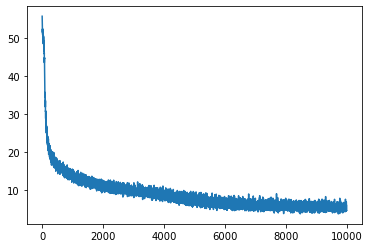

In [36]:
from matplotlib import pyplot as plt
import numpy as np
print(model.history.history.keys())
loss = model.history.history['loss']
plt.plot(loss)
plt.yscale('linear')
np.mean(loss[9000:10000])

In [10]:
batch = imageGeneration.get_batch(lambda: get_image_parameters(), 100, suppress_warnings = True)

Time taken for batch generation of size 100: 3.013932943344116 s.


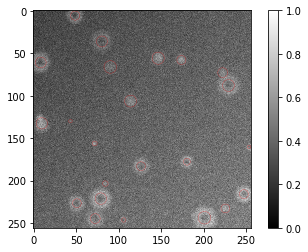

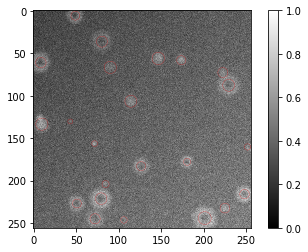

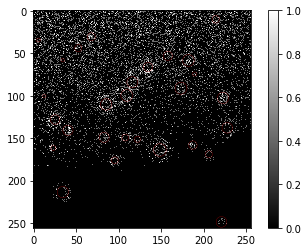

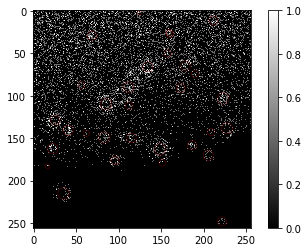

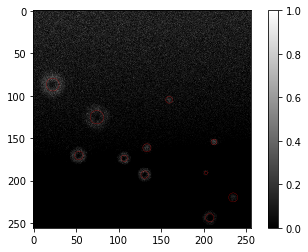

...

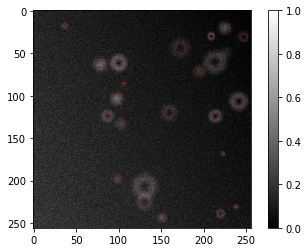

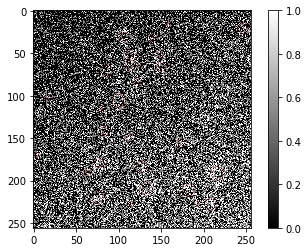

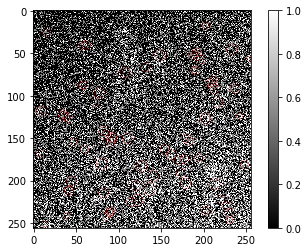

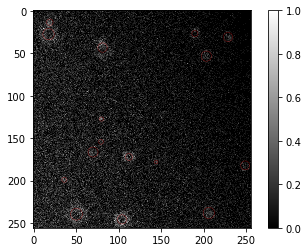

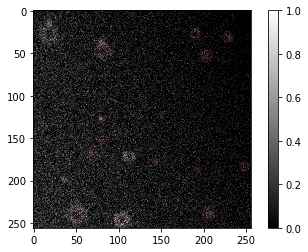

KeyboardInterrupt: 

In [11]:
(batch_images, batch_labels, batch_predictions, batch_particle_attributes) = batch
batch_predictions = unet.predict(model, batch_images)
batch = (batch_images, batch_labels, batch_predictions, batch_particle_attributes)

for i in range(100):
    print("\n")
    imageGeneration.visualise_batch(batch, i, use_predictions = False)
    imageGeneration.visualise_batch(batch, i, apply_sigmoid = True, apply_cutoff = True, cutoff_value = 0.5)